In [66]:
Потренируем навыки, полученные на практическом занятии.
​
Пользуясь новыми знаниями, проведите эксплоративный анализ данных на данных недвижимости Бостона, и попытайтесь обучить линейную модель наиболее качественно. Все ваши действия и решения описывайте в markdown.
​
Данные вы сможете получить исполнив следующий код:
from sklearn.datasets import load_boston
import pandas as pd
data = pd.read_csv(load_boston()[‘filename’], skiprows=1)
​
Переменная, которую надо предсказать - ’MEDV’.
​
Прочитать информацию о содержимом датасета:
print(load_boston()[‘DESCR’])
​
Если вы неудовлетворенны результатом, но лучшего решения предложить не можете, то высылайте задание на проверку.
Цель задания - закрепить полученные навыки.

SyntaxError: invalid syntax (<ipython-input-66-0e080c29a2f2>, line 1)

In [211]:
from sklearn.datasets import load_boston
import pandas as pd
data = pd.read_csv(load_boston()['filename'], skiprows=1)

In [212]:
print(load_boston()['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

### Начало

In [213]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import numpy as np

%matplotlib inline

In [214]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [215]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [216]:
data.profile_report()

Поверхностный осмотр показывает, что:
- нулевые значения в выборке отсутствуют, все строки заполнены
- категориальные значения в выборке отсутствуют
- profile_report выделил высокую корреляцию между признаками TAX и RAD, стоит посмотреть смысл этих показателей. Возможно один убрать
- признак ZN содержит 73,5% нулевых значений

### Рассмотрим признаки в отдельности с позиции важности для построения модели линейной регрессии:

CRIM - рейтинг преступлености по городам на душу населения. 

Сам по себе показатель звучит важно и его необходимо остваить для предсказаний. :) 

Видим очень большой размах между минимальным и максимальным значением 0,006 - 88, 976
Посмотрим частотный график на предмет выбросов.

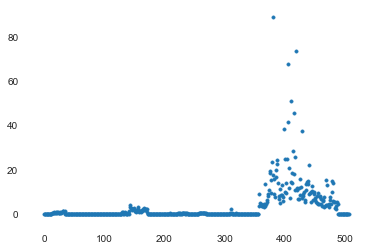

In [217]:
len_column = len(data['CRIM']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data['CRIM'], marker='.')

На графике заметны выбросы или аномалии/уникальные значения с очень высоким уровнем преступности. Посчитаем, что это нетипичная ситуация и попробуем исключить её влияние. 

Проведем нормализацию признаков и уберем их. Для этого в качестве выбросов примем значения свыше или меньше 0.95 и 0.05 квантиля. 

In [218]:
data_norm = data[(data['CRIM'] < data['CRIM'].quantile(0.95)) & (data['CRIM'] > data['CRIM'].quantile(0.05))]

In [219]:
data_norm.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,454.000000,454.000000,454.00000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000,454.000000
mean,2.210951,8.958150,11.22630,0.074890,0.555089,6.289806,68.813877,3.737611,9.118943,400.482379,18.464537,359.630639,12.334251,22.750000
std,3.717094,19.271197,6.73459,0.263504,0.114233,0.664869,27.607131,1.965227,8.334558,163.281156,2.164993,85.428961,6.515796,8.686153
min,0.028750,0.000000,1.25000,0.000000,0.392000,3.561000,2.900000,1.129600,1.000000,188.000000,12.600000,0.320000,1.730000,6.300000
25%,0.090657,0.000000,5.64000,0.000000,0.454250,5.889500,45.800000,2.163375,4.000000,279.500000,17.400000,375.377500,7.205000,17.525000
50%,0.256510,0.000000,9.69000,0.000000,0.538000,6.185000,77.150000,3.207450,5.000000,330.000000,19.000000,391.240000,11.330000,21.300000
75%,2.429845,0.000000,18.10000,0.000000,0.624000,6.592250,93.600000,4.812200,8.000000,437.000000,20.200000,396.120000,16.337500,25.000000
max,15.575700,95.000000,27.74000,1.000000,0.871000,8.780000,100.000000,10.710300,24.000000,711.000000,22.000000,396.900000,34.770000,50.000000


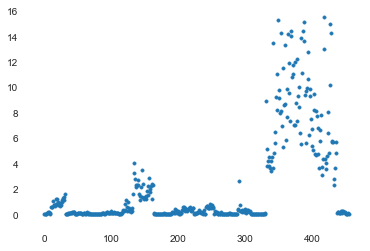

In [220]:
len_column = len(data_norm['CRIM']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['CRIM'], marker='.')

График стал плавнее, большинство объектов уложилось в рейтинг ниже 16-ти. 

перейдем к следлующему признаку. 

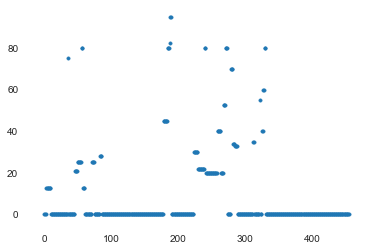

In [221]:
len_column = len(data_norm['ZN']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['ZN'], marker='.')

Каких-то однозначных выбросов не 

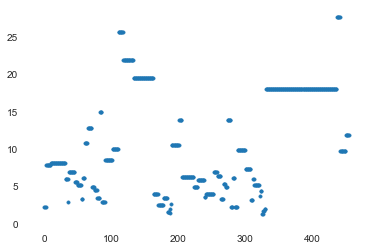

In [222]:
len_column = len(data_norm['INDUS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['INDUS'], marker='.')

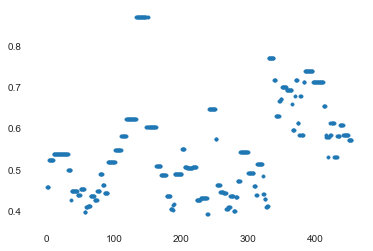

In [223]:
len_column = len(data_norm['NOX']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['NOX'], marker='.')

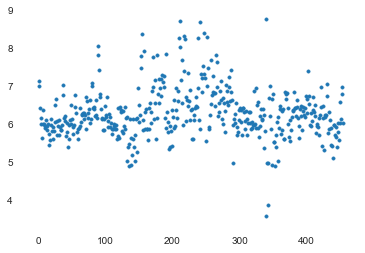

In [224]:
len_column = len(data_norm['RM']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['RM'], marker='.')

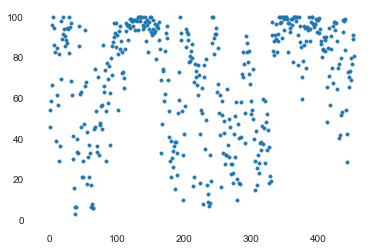

In [225]:
len_column = len(data_norm['AGE']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['AGE'], marker='.')

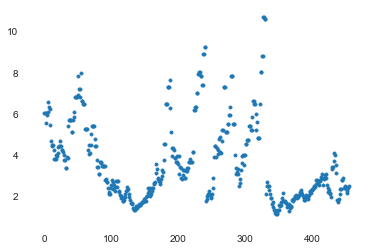

In [226]:
len_column = len(data_norm['DIS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['DIS'], marker='.')

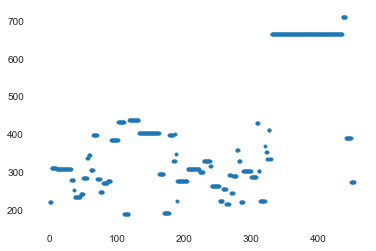

In [227]:
len_column = len(data_norm['TAX']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['TAX'], marker='.')

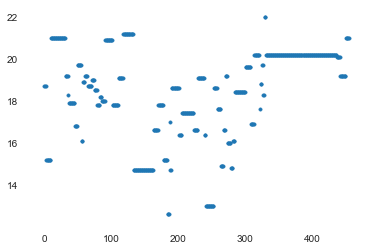

In [228]:
len_column = len(data_norm['PTRATIO']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['PTRATIO'], marker='.')

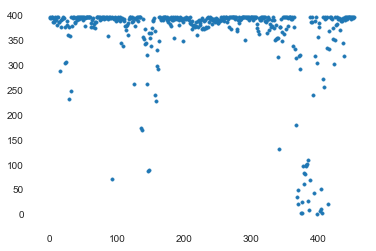

In [229]:
len_column = len(data_norm['B']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['B'], marker='.')

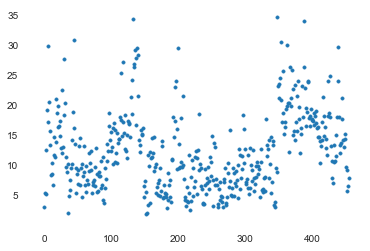

In [230]:
len_column = len(data_norm['LSTAT']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['LSTAT'], marker='.')

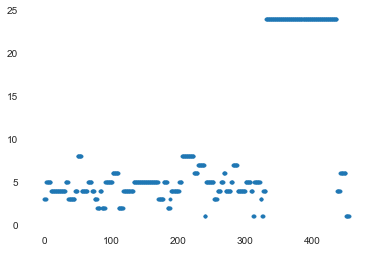

In [231]:
len_column = len(data_norm['RAD']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['RAD'], marker='.')

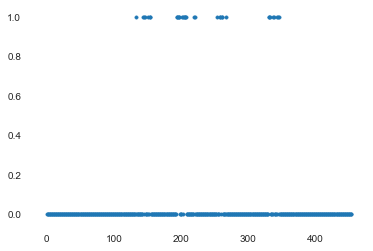

In [232]:
len_column = len(data_norm['CHAS']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['CHAS'], marker='.')

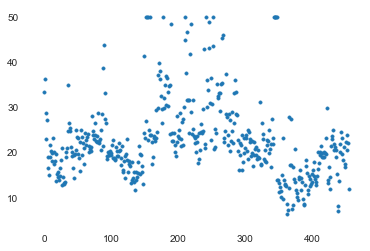

In [233]:
len_column = len(data_norm['MEDV']) 
x = np.linspace(0, len_column, len_column)
plt.scatter(x, data_norm['MEDV'], marker='.')

Навскидку выбросить какие-либо признаки как незначительные оп логическим основаниям не удалось. 

Посмотрим наличие сильной взаимной скоррелированности признаков между собой при помощи HeatMap.

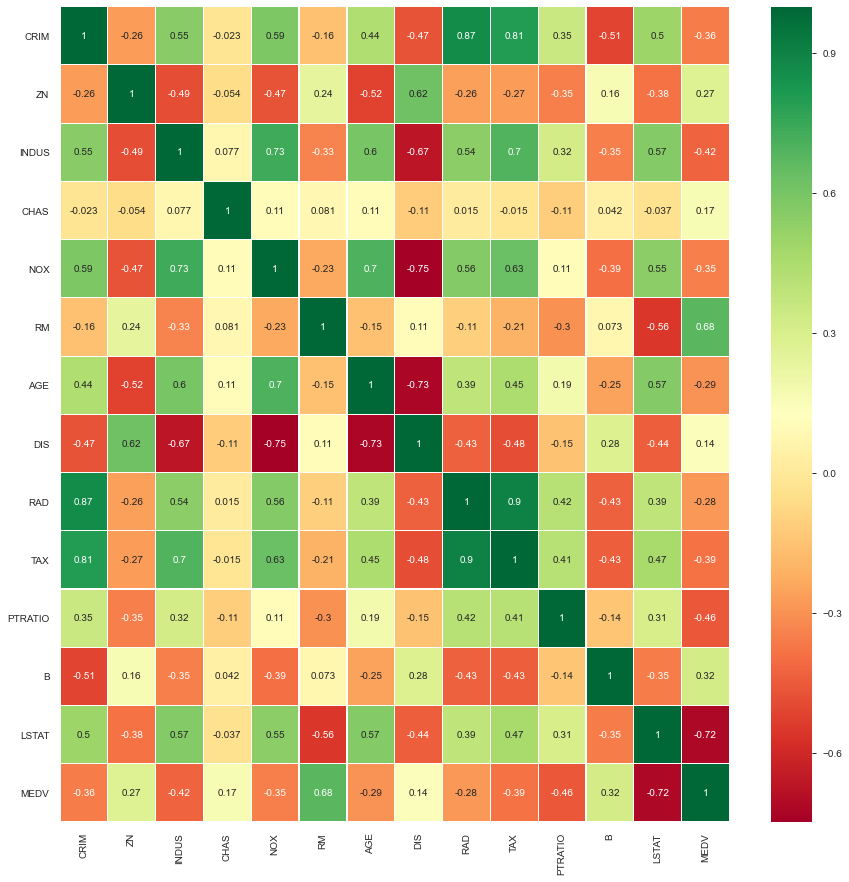

In [234]:
sns.heatmap(data_norm.corr(),annot=True,cmap='RdYlGn',linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(15,15)
plt.show()

Наиболее скоррелированные признаки по матрице корреляций:
- 0.9 RAD & TAX
- 0.81 CRIM & TAX
- -0.75 DIS & NOX
- -0.73 AGE & DIS

По моему мнению логически могут иметь зависимость показатели DIS & NOX; чем ближе к основным магистралям, тем большее количество выбросов в воздухе. Показатель DIS попробуем исключить из признаков.

По остальным признакам сделать такой вывод нет оснований.

In [238]:
data_norm = data_norm.drop('DIS', axis=1)

Так как среди признаков есть как количественные, так и булевые - 1/0 для признака CHAS, то приведем данные к виду [-1/1] для дальнейшей трансформации при помощи min_max_scaler.

### Normilize

In [239]:
headers = list(data_norm.columns.values)

In [240]:
df_to_norm = data_norm.loc[:,headers]

In [241]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler(feature_range=(-1,1))

np_scaled = min_max_scaler.fit_transform(df_to_norm)
df_norm = pd.DataFrame(np_scaled)
df_norm.columns = headers
df_norm.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,-0.999534,-1.000000,-0.929785,-1.0,-0.724426,0.317111,-0.116375,-0.826087,-0.869981,0.297872,0.988552,-0.926755,0.240275
1,-0.994816,-1.000000,-0.929785,-1.0,-0.724426,0.374210,0.056643,-0.826087,-0.869981,0.297872,1.000000,-0.782082,0.368421
2,-0.999858,-1.000000,-0.929785,-1.0,-0.724426,0.099444,0.149331,-0.826087,-0.869981,0.297872,0.985980,-0.789346,0.025172
3,-0.992341,-0.736842,-0.500189,-1.0,-0.448852,-0.060740,0.312049,-0.652174,-0.529637,-0.446809,0.993444,-0.352300,-0.240275
4,-0.985103,-0.736842,-0.500189,-1.0,-0.448852,0.000575,0.919670,-0.652174,-0.529637,-0.446809,1.000000,0.054479,-0.048055


### Learn & predict

Составим модель линейной регрессии для нескольких переменных. 

In [242]:
from sklearn import linear_model

В качестве набора признаков модели передадим всё, кроме 'MEDV'.
В качестве целевого признака выделим MEDV. 

In [243]:
X = df_norm.drop('MEDV', axis=1)
Y = df_norm['MEDV']

При помощик train_test_split разобьем нашу модель на обучающие и проверочные данные с пропорцией 80 и 20 %. 

In [274]:
from sklearn.model_selection import train_test_split

# x = medv,
# y = lstat
X_train, X_test, y_train, y_test = train_test_split(
    X,
    Y,
    test_size = 0.2
)

Обучим нашу модель на тренировочных данных и попробуем предсказать значение MEDV. 

In [275]:
model = linear_model.LinearRegression()
model.fit(X_train, y_train)

print('Intercept: \n', model.intercept_)
print('Coefficients: \n', model.coef_)

predicted_y = model.predict(X_test)

Intercept: 
 -0.5174251824981406
Coefficients: 
 [ 0.01080618 -0.04616913  0.03425085  0.04217936 -0.08431482  0.51175855
  0.08136588  0.12465153 -0.11857071 -0.19557579  0.11422813 -0.47298751]


Оценим модель при помощи .score. 

In [276]:
model.score(X_test, y_test)

0.763183550099602

Показатель score модели достаточно невысок. Необходимо продолжать работу над моделью или её признаками.

### Denormilize - back to common

Приведем полученные предсказания в исходную размерность при помощи операции .inverse_transform. 

In [247]:
df_prediction = X_test.copy()
df_prediction.loc[:, 'MEDV'] = predicted_y

In [248]:
df_back_to_denorm = min_max_scaler.inverse_transform(df_prediction)

In [249]:
df_back_to_denorm = pd.DataFrame(df_back_to_denorm)
df_back_to_denorm.columns = headers
df_back_to_denorm.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.05083,0.0,5.19,0.0,0.515,6.316,38.1,5.0,224.0,20.2,389.71,5.68,25.598822
1,0.04741,0.0,11.93,0.0,0.573,6.030,80.8,1.0,273.0,21.0,396.90,7.88,22.136379
2,0.26363,0.0,8.56,0.0,0.520,6.229,91.2,5.0,384.0,20.9,391.23,15.55,18.394310
3,2.77974,0.0,19.58,0.0,0.871,4.903,97.8,5.0,403.0,14.7,396.90,29.29,8.278469
4,0.28960,0.0,9.69,0.0,0.585,5.390,72.9,6.0,391.0,19.2,396.90,21.14,12.134193
